In [ ]:
import torch
import torch.nn as nn
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the trained autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=2, stride=2),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Define model path and load weights
model_path = "/content/drive/MyDrive/autoencoder_model_27mar.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Autoencoder().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()  # Set to evaluation mode
print("Autoencoder model loaded successfully!")

Mounted at /content/drive
Autoencoder model loaded successfully!


The leaf does NOT belong to MBMU Campus. (MSE: 0.077883)


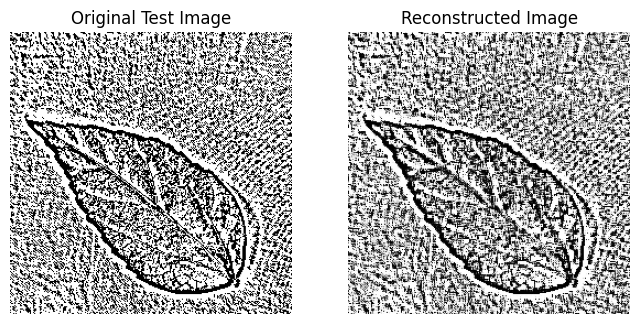

Reconstructed image saved at: /content/drive/MyDrive/reconstructed_image_new_leaf_implement1.jpg
Reconstructed Image Matrix:
[[0.5486421  0.03940213 0.99906427 ... 0.85445285 0.9048723  0.88785285]
 [0.8392648  0.19956928 0.99999166 ... 0.06315207 0.99471325 0.79168296]
 [0.99337065 0.99055475 0.9966884  ... 0.93195766 0.8814393  0.9277687 ]
 ...
 [0.9180678  0.9999981  0.99897027 ... 0.64147377 0.989223   0.9908482 ]
 [0.02751302 0.9990652  0.9938232  ... 0.5859889  0.02010419 0.99559844]
 [0.93793064 0.999826   0.84622115 ... 0.11420374 0.05033412 0.9991353 ]]


In [ ]:

# Define the path where the test image is stored in Google Drive
test_image_path = "/content/drive/MyDrive/MBMU_Leaves/new_leaf.jpg"  # Change filename if needed

# Function to load and preprocess the image
def preprocess_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale

    # Get original dimensions
    h, w = img.shape

    # Find the longer side and compute padding
    if h > w:
        pad = (h - w) // 2
        img = cv2.copyMakeBorder(img, 0, 0, pad, pad, cv2.BORDER_CONSTANT, value=0)
    elif w > h:
        pad = (w - h) // 2
        img = cv2.copyMakeBorder(img, pad, pad, 0, 0, cv2.BORDER_CONSTANT, value=0)

    # Resize to 256x256 after making it square
    img = cv2.resize(img, (256, 256))

    # Apply adaptive thresholding
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                cv2.THRESH_BINARY, 11, 2)

    # Convert to tensor and normalize
    img = np.expand_dims(img, axis=0)  # Add channel dimension
    img = torch.tensor(img, dtype=torch.float32) / 255.0  # Normalize to [0,1]
    img = img.unsqueeze(0)  # Add batch dimension

    return img.to(device)

# Preprocess the uploaded image
test_image = preprocess_image(test_image_path)

# Pass the image through the autoencoder
with torch.no_grad():
    reconstructed_image = model(test_image).cpu().numpy().squeeze()

# Compute Mean Squared Error (MSE) between original and reconstructed image
mse = np.mean((test_image.cpu().numpy().squeeze() - reconstructed_image) ** 2)

# Decide if the image belongs to MBMU Campus based on reconstruction error
threshold_mse = 0.03  # Adjust this based on dataset analysis
if mse < threshold_mse:
    print(f"The leaf belongs to MBMU Campus. (MSE: {mse:.6f})")
else:
    print(f"The leaf does NOT belong to MBMU Campus. (MSE: {mse:.6f})")

# Display the original and reconstructed image
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original Test Image")
ax[0].axis("off")

ax[1].imshow(reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image to Google Drive
reconstructed_path = "/content/drive/MyDrive/reconstructed_image_new_leaf_implement1.jpg"
cv2.imwrite(reconstructed_path, (reconstructed_image * 255).astype(np.uint8))
print(f"Reconstructed image saved at: {reconstructed_path}")

# Print the reconstructed image matrix
print("Reconstructed Image Matrix:")
print(reconstructed_image)


The new leaf belongs to MBMU Campus. (MSE: 0.019270)


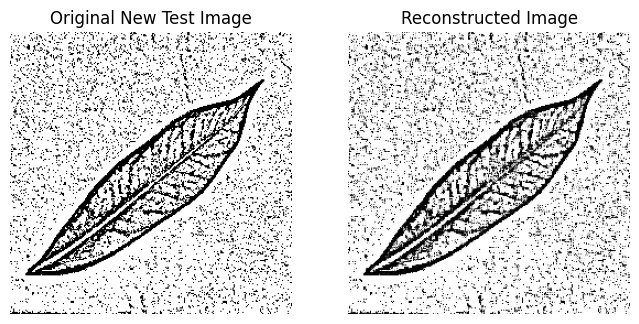

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_jamun_image.jpg
Reconstructed Image Matrix:
[[0.9978644  0.8649222  0.9999409  ... 0.9998197  0.9170227  0.99560565]
 [0.9919808  0.99936646 0.99998033 ... 0.9999987  0.9999558  0.99993336]
 [0.93666583 0.00467211 0.9983814  ... 0.99666685 0.00905401 0.9943574 ]
 ...
 [0.33123308 0.98918366 0.9767804  ... 0.99980587 0.9531153  0.9992092 ]
 [0.99202394 0.9687601  0.72207403 ... 0.99962366 0.99363273 0.9959876 ]
 [0.03486104 0.00253174 0.00236215 ... 0.9931115  0.97008777 0.9919748 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/NNpro1_jamun_test.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_jamun_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)


The new leaf does NOT belong to MBMU Campus. (MSE: 0.037524)


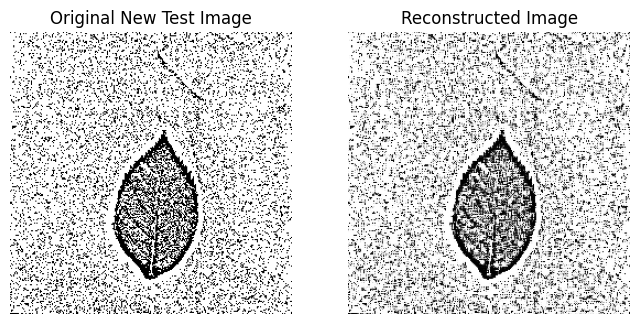

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_rose_image.jpg
Reconstructed Image Matrix:
[[0.4116218  0.97126937 0.9281002  ... 0.9964725  0.8380418  0.01017267]
 [0.997717   0.99999344 0.9999695  ... 0.9917257  0.0220142  0.6870529 ]
 [0.9899687  0.999795   0.9858811  ... 0.99841416 0.97750205 0.922265  ]
 ...
 [0.989985   0.01108048 0.9155794  ... 0.9998317  0.99999774 0.994212  ]
 [0.99931824 0.9965082  0.9996923  ... 0.96514887 0.99510455 0.05918526]
 [0.03733957 0.00406184 0.32545403 ... 0.99974495 0.9935138  0.01387942]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/NNpro1_rose_test.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_rose_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.027990)


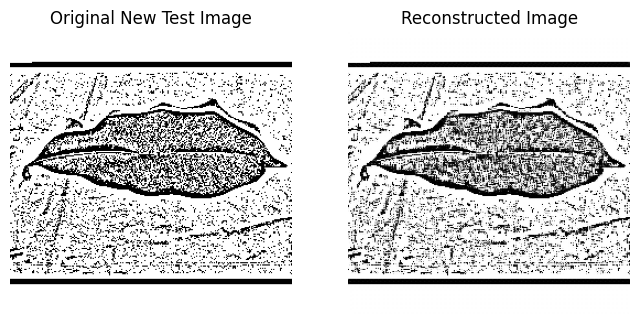

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_mango_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/mango_leaf_test.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_mango_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.012062)


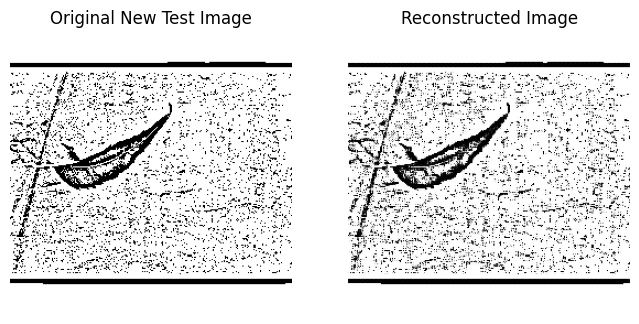

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_neem_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/neem_leaf_test.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_neem_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.027729)


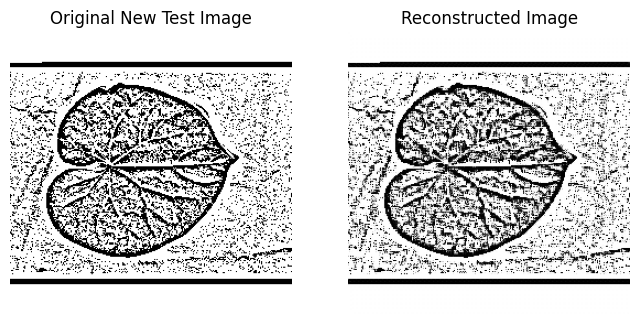

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_money_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/money_leaf.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_money_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.015806)


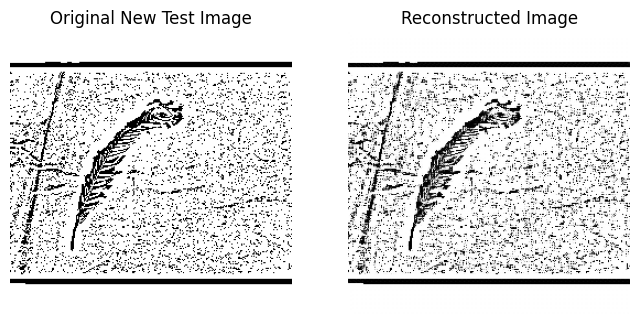

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_khe_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/Khe_leaf.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_khe_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.017463)


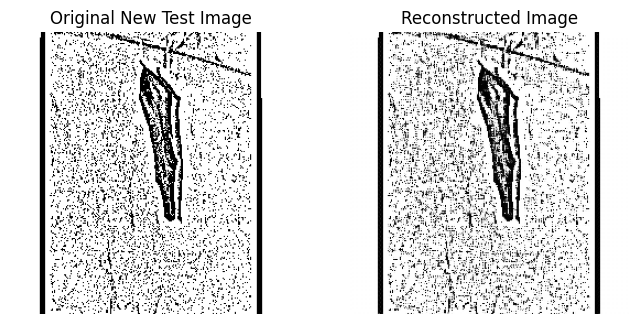

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_newleaf2_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/New_leaf2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_newleaf2_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.037200)


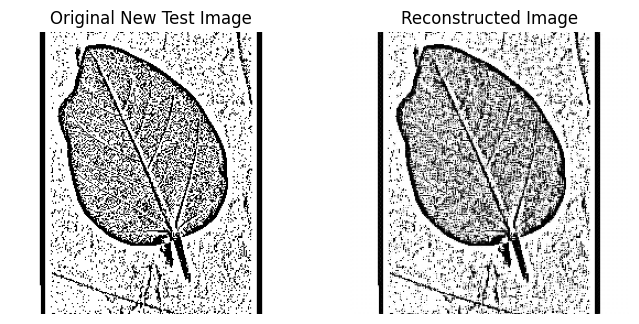

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_newleaf3_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/new_leaf3.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_newleaf3_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.020729)


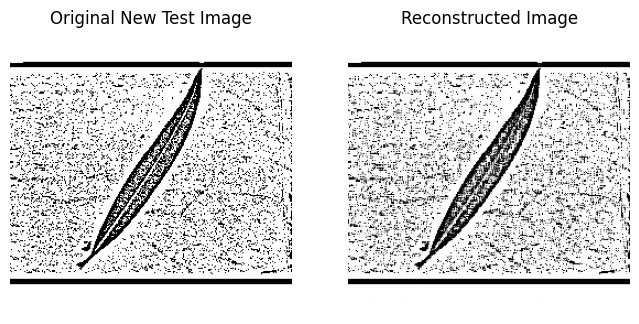

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_kaner_image.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99976104 0.9987633  0.997509  ]
 [0.9997707  0.99999917 0.9999964  ... 0.99999905 0.99995196 0.999964  ]
 [0.9988764  0.9998204  0.9987214  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.9998822  1.         0.9994166  ... 0.99999595 0.9999764  0.99999225]
 [0.9977272  0.9967026  0.9998288  ... 0.9975593  0.99954236 0.9993168 ]
 [0.9964366  0.99619603 0.99675226 ... 0.99960667 0.9890919  0.9987141 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/kaner_leaf.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_kaner_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.020443)


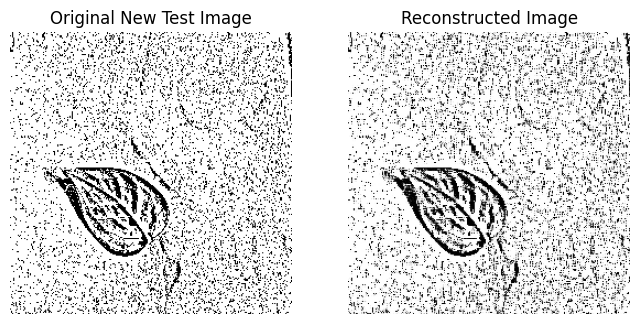

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_money3_image.jpg
Reconstructed Image Matrix:
[[0.99331397 0.9504034  0.12441342 ... 0.81849015 0.9805069  0.9937861 ]
 [0.97586864 0.999796   0.0523372  ... 0.02500545 0.9983455  0.9986449 ]
 [0.9963366  0.99992704 0.00486755 ... 0.03304448 0.02078812 0.2615025 ]
 ...
 [0.5847974  0.8398651  0.97900087 ... 0.99999416 0.9999068  0.99982965]
 [0.99887365 0.26991272 0.9999298  ... 0.9833512  0.9891917  0.9989723 ]
 [0.97718436 0.83096564 0.08541074 ... 0.99966884 0.9937503  0.9953334 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/money_leaf3.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_money3_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.051463)


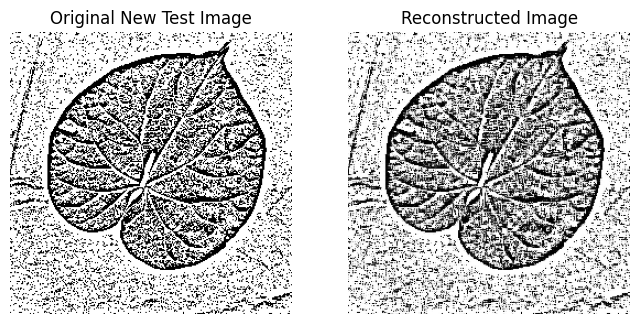

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_money2_image.jpg
Reconstructed Image Matrix:
[[0.94141984 0.999864   0.9810037  ... 0.9975924  0.9229363  0.9762738 ]
 [0.98205274 0.9998141  0.01049106 ... 0.99956864 0.99051344 0.00560496]
 [0.99675024 0.98192364 0.9996449  ... 0.99742776 0.01214993 0.0215459 ]
 ...
 [0.99808455 0.9999995  0.9996773  ... 0.03318352 0.99946076 0.9040326 ]
 [0.01360203 0.9946648  0.99362576 ... 0.9887278  0.9965103  0.997357  ]
 [0.89946824 0.99996996 0.988839   ... 0.10864314 0.9838605  0.97876066]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/money_leaf2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_money2_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.044066)


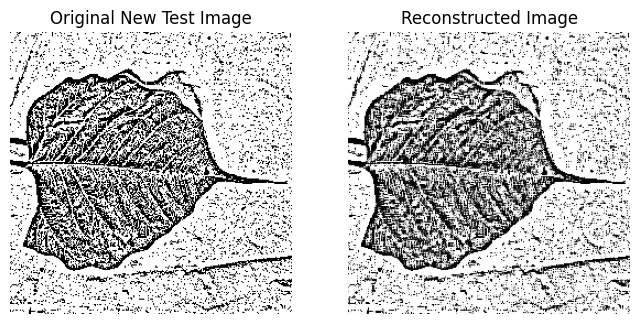

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_new7_image.jpg
Reconstructed Image Matrix:
[[1.5002038e-02 9.9729735e-01 9.9979717e-01 ... 9.9931264e-01
  9.4372433e-01 9.9718237e-01]
 [9.9765366e-01 9.9998128e-01 9.9999654e-01 ... 9.9925739e-01
  6.1505521e-03 9.9056178e-01]
 [9.9189574e-01 9.9941051e-01 9.9788433e-01 ... 9.9955207e-01
  6.3240534e-04 9.8949885e-01]
 ...
 [3.4598049e-02 9.9895477e-01 7.2150749e-01 ... 9.9996471e-01
  5.3722359e-02 9.8535144e-01]
 [9.0993065e-01 9.9884725e-01 9.8583442e-01 ... 9.9744582e-01
  9.8981571e-01 8.2969385e-01]
 [8.9271975e-01 9.9995530e-01 9.5270419e-01 ... 9.9935442e-01
  5.1622021e-01 9.8891163e-01]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/new_leaf7.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_new7_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.053871)


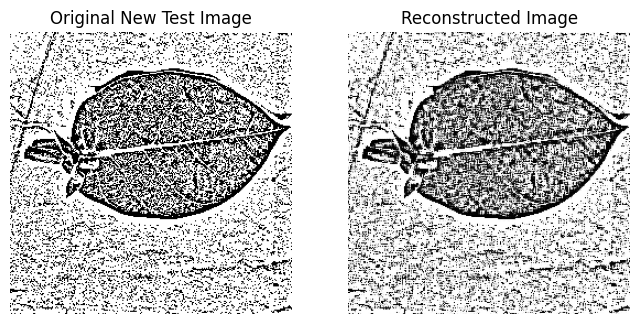

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_new6_image.jpg
Reconstructed Image Matrix:
[[0.9927322  0.9998412  0.9971834  ... 0.9936261  0.9450485  0.95725167]
 [0.99850404 1.         0.9999987  ... 0.98162544 0.9900809  0.19333413]
 [0.03165394 0.9991247  0.92646307 ... 0.98754483 0.99979156 0.01800117]
 ...
 [0.98797977 0.9999459  0.9993048  ... 0.9999982  0.9998311  0.9981876 ]
 [0.96920186 0.99931014 0.9995223  ... 0.9997919  0.9924784  0.998528  ]
 [0.8016785  0.13205448 0.88719714 ... 0.99907696 0.99012697 0.9994281 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/new_leaf6.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_new6_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.032703)


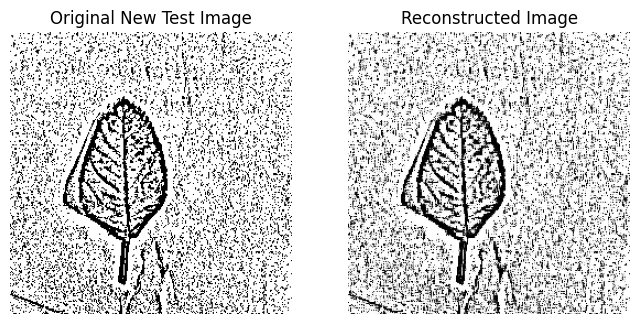

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_rose2_image.jpg
Reconstructed Image Matrix:
[[0.9958545  0.9952566  0.9999733  ... 0.22401188 0.96275526 0.00956444]
 [0.9926717  0.7981139  0.9969748  ... 0.9999896  0.99845016 0.9613969 ]
 [0.9984855  0.96380204 0.5145659  ... 0.99924254 0.998139   0.99865794]
 ...
 [0.9841531  0.9988355  0.00583335 ... 0.99999964 0.99988425 0.99990666]
 [0.99233717 0.9964575  0.99811816 ... 0.99953103 0.99276006 0.9982212 ]
 [0.99633694 0.9994504  0.824297   ... 0.99950314 0.9890872  0.99878055]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/rose_2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_rose2_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.024643)


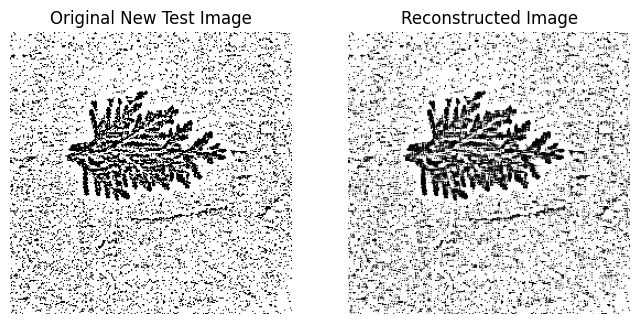

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_christ_image.jpg
Reconstructed Image Matrix:
[[0.9985349  0.99291396 0.9858415  ... 0.93376285 0.9990139  0.99415827]
 [0.9986927  0.9766133  0.9983047  ... 0.03953905 0.9995115  0.98180366]
 [0.9956483  0.87770134 0.99264455 ... 0.98265946 0.9997266  0.99996257]
 ...
 [0.9992404  0.9999957  0.01171747 ... 0.9999964  0.99933976 0.99801373]
 [0.9924461  0.6096911  0.9471615  ... 0.99979025 0.9999206  0.9997062 ]
 [0.9912281  0.9993174  0.74088466 ... 0.99935573 0.98976773 0.9971187 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/christ_leaf.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_christ_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.032250)


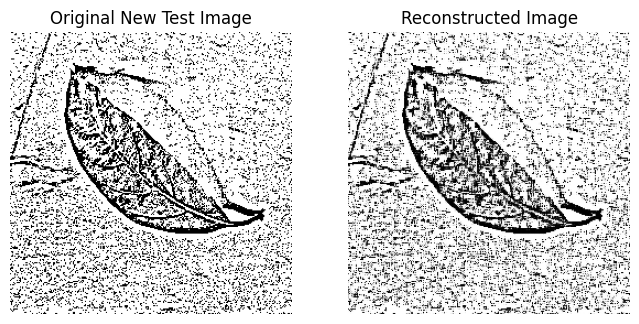

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_new4_image.jpg
Reconstructed Image Matrix:
[[0.4394093  0.00676993 0.0079145  ... 0.9976037  0.72408533 0.9934889 ]
 [0.99949837 0.9999976  0.999892   ... 0.99833775 0.02043962 0.9988998 ]
 [0.99880946 0.99996364 0.99642193 ... 0.98061645 0.998978   0.9966354 ]
 ...
 [0.98044765 0.9620072  0.07418521 ... 0.99823123 0.9999802  0.99800795]
 [0.9978802  0.9899732  0.98474646 ... 0.999273   0.99979824 0.99942625]
 [0.99588364 0.9998223  0.9745238  ... 0.00529046 0.9430797  0.20820038]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/new_leaf4.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_new4_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.032155)


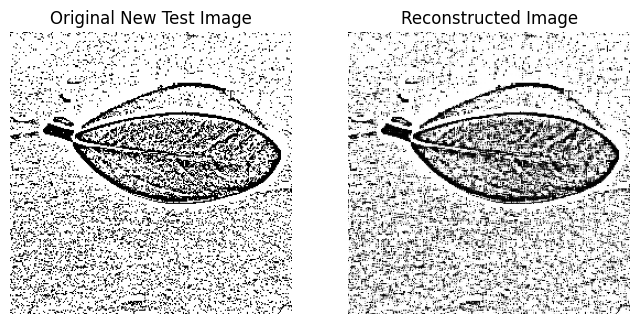

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_new5_image.jpg
Reconstructed Image Matrix:
[[0.00278518 0.0070601  0.02281249 ... 0.17833893 0.98050034 0.94663525]
 [0.9807582  0.99998903 0.99998176 ... 0.9999819  0.9994479  0.9999912 ]
 [0.01724957 0.9994766  0.9740108  ... 0.99792176 0.01919415 0.8648601 ]
 ...
 [0.45950443 0.9598692  0.93142986 ... 0.99999833 0.9999726  0.9991423 ]
 [0.46906352 0.18690829 0.9462273  ... 0.99749124 0.99899024 0.9987639 ]
 [0.02518311 0.78895485 0.9164315  ... 0.9996686  0.99432725 0.9883736 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/new_leaf5.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_new5_image.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.041078)


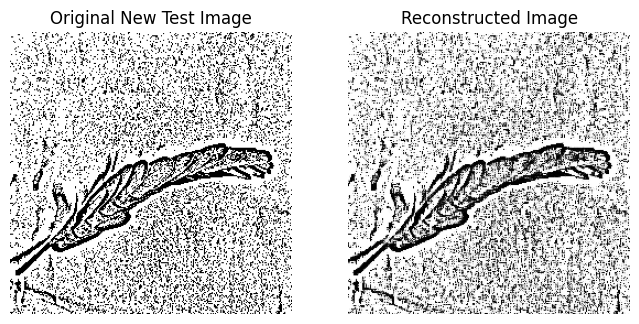

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_khe2.jpg
Reconstructed Image Matrix:
[[0.99564654 0.9998022  0.99991953 ... 0.99039066 0.99993575 0.9997893 ]
 [0.99984705 0.9999794  0.99992406 ... 0.99907994 0.999977   0.999951  ]
 [0.9928012  0.997818   0.96363896 ... 0.9969651  0.99888366 0.99738866]
 ...
 [0.9998179  0.999316   0.9172165  ... 0.9999999  0.99999034 0.999814  ]
 [0.00745591 0.47959787 0.01229444 ... 0.9997508  0.99871397 0.99461836]
 [0.5641278  0.65907913 0.9760251  ... 0.99990463 0.97133416 0.99601763]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/khe2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_khe2.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.042339)


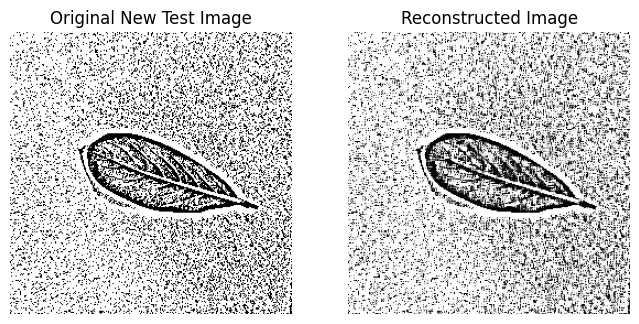

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_mada_leaf_1.jpg
Reconstructed Image Matrix:
[[0.99511176 0.99922585 0.9998858  ... 0.9697353  0.09846721 0.9813588 ]
 [0.99997306 0.99890804 0.9999126  ... 0.04088785 0.04209851 0.964421  ]
 [0.9968002  0.9996898  0.99936813 ... 0.9981962  0.9996618  0.99979204]
 ...
 [0.66206807 0.06111208 0.9918218  ... 0.99999905 0.01772581 0.12187082]
 [0.03255352 0.9997557  0.9970245  ... 0.99986935 0.00306571 0.01848476]
 [0.13485397 0.9978993  0.89143413 ... 0.97460926 0.12241728 0.23086111]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/mada_leaf_1.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_mada_leaf_1.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.011603)


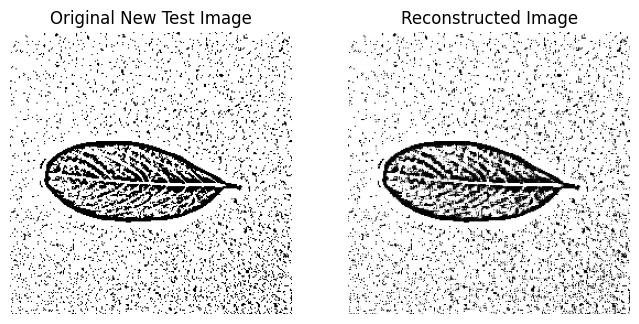

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_mada_leaf_2.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.99981874 0.99954295 0.9996929 ]
 [0.9997707  0.99999917 0.9999964  ... 0.99997485 0.99998045 0.9999862 ]
 [0.9988764  0.9998204  0.9987214  ... 0.98793423 0.99924254 0.9993488 ]
 ...
 [0.9159594  0.24991211 0.99567115 ... 0.9999293  0.9977192  0.8339097 ]
 [0.99585825 0.9976719  0.9926358  ... 0.9996263  0.3437877  0.9248271 ]
 [0.82665735 0.83582425 0.4965408  ... 0.98017186 0.72662157 0.7382056 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/mada_leaf_2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_mada_leaf_2.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.035993)


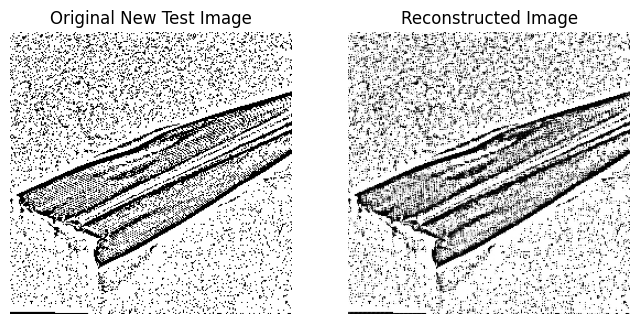

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_lily_leaf1.jpg
Reconstructed Image Matrix:
[[9.90874290e-01 9.99283731e-01 9.86788034e-01 ... 6.73229247e-02
  9.82152879e-01 9.60921705e-01]
 [9.99232769e-01 9.59837258e-01 8.68942380e-01 ... 9.96563137e-01
  9.97400880e-01 9.99978185e-01]
 [9.97688174e-01 9.99535918e-01 9.99964833e-01 ... 1.10374030e-03
  2.41215453e-01 9.95855749e-01]
 ...
 [9.99975920e-01 9.99992251e-01 9.99995589e-01 ... 9.99625087e-01
  9.97476399e-01 9.93982852e-01]
 [1.88046813e-01 1.59832433e-01 7.51064494e-02 ... 9.99875069e-01
  9.99970436e-01 9.99839306e-01]
 [1.29351124e-01 1.09697901e-01 7.22010620e-03 ... 9.68975772e-04
  1.10299885e-01 8.08103442e-01]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/lily_leaf1.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_lily_leaf1.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.020419)


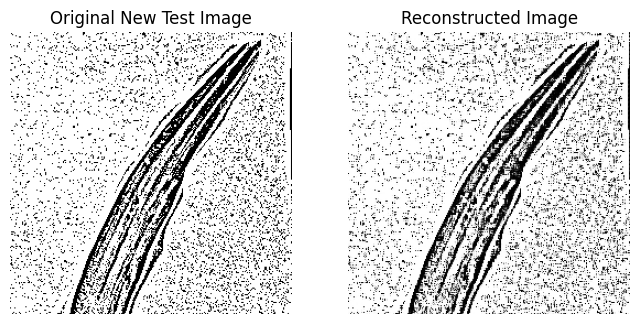

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_lily_leaf2.jpg
Reconstructed Image Matrix:
[[0.952982   0.820155   0.916298   ... 0.99995434 0.99823904 0.09630538]
 [0.98979914 0.09895933 0.9802931  ... 0.9999893  0.99537706 0.00777924]
 [0.9664638  0.9999876  0.00799804 ... 0.9944665  0.9997336  0.36245784]
 ...
 [0.9956001  0.99996674 0.99115306 ... 0.9999666  0.9998834  0.99999905]
 [0.99166334 0.9830257  0.99695575 ... 0.9982413  0.999041   0.99878174]
 [0.9762249  0.99626464 0.18739766 ... 0.9976776  0.90020454 0.9973712 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/lily_leaf2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_lily_leaf2.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.043462)


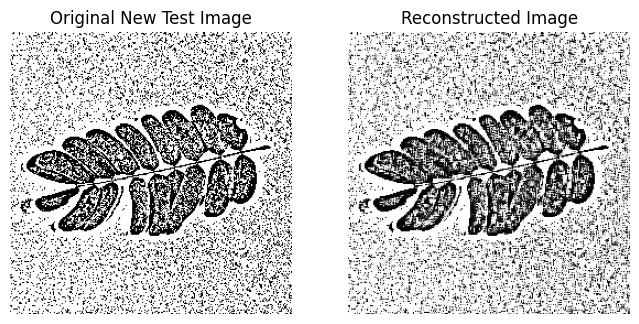

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_gulmo_leaf_1.jpg
Reconstructed Image Matrix:
[[0.9324825  0.9926564  0.994293   ... 0.3395439  0.9943216  0.9611485 ]
 [0.99781835 0.97874707 0.01334815 ... 0.9998913  0.99946254 0.9998779 ]
 [0.99903995 0.9982266  0.99630827 ... 0.9911214  0.99030834 0.996829  ]
 ...
 [0.01463193 0.9999814  0.99985087 ... 0.9955468  0.3390269  0.32228255]
 [0.97301936 0.99576735 0.99781907 ... 0.9981919  0.13564748 0.1230759 ]
 [0.9088857  0.9998609  0.9932933  ... 0.9964491  0.04355411 0.34498423]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/gulmohar_leaf_1.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_gulmo_leaf_1.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.036681)


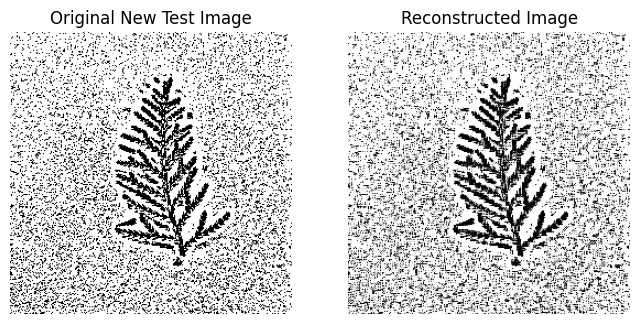

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_christ_2.jpg
Reconstructed Image Matrix:
[[0.9961836  0.9989542  0.99994147 ... 0.99617296 0.9945332  0.998478  ]
 [0.9999782  0.99999344 0.9999733  ... 0.99999785 0.9998809  0.9999329 ]
 [0.99147475 0.99556065 0.9979114  ... 0.9851627  0.99802375 0.9992219 ]
 ...
 [0.940603   0.8693535  0.71138656 ... 0.9975262  0.99999106 0.9999372 ]
 [0.995063   0.2124798  0.987071   ... 0.9970203  0.99874437 0.99919957]
 [0.5554596  0.77055436 0.97271776 ... 0.99997556 0.996739   0.9987931 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/christ_2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_christ_2.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.075623)


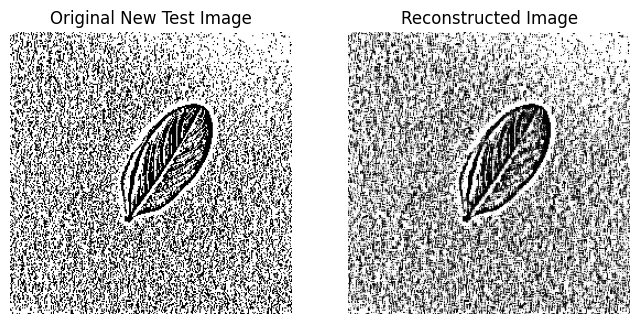

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_mada_leaf3.jpg
Reconstructed Image Matrix:
[[0.9955598  0.9999132  0.99517375 ... 0.9994331  0.9997757  0.99959224]
 [0.9752059  0.99984264 0.9980332  ... 0.9999516  0.9999888  0.9999907 ]
 [0.9854419  0.9804631  0.99826115 ... 0.9868743  0.99949634 0.99947935]
 ...
 [0.9778676  0.9999745  0.984583   ... 0.9999635  0.98220104 0.2778052 ]
 [0.5846535  0.9834194  0.13424729 ... 0.9914386  0.99261695 0.00331342]
 [0.9954573  0.999089   0.08914741 ... 0.9997106  0.4224599  0.7405992 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/mada_leaf3.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_mada_leaf3.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.065196)


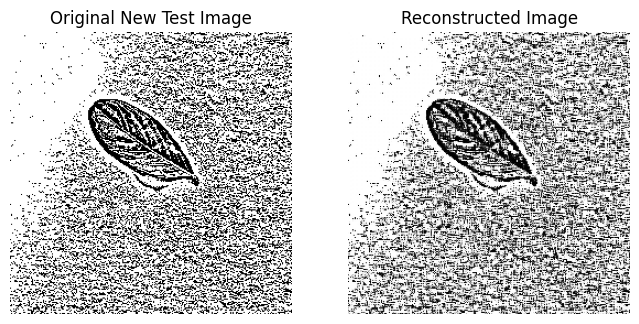

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_mada_leaf4.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.9989095  0.972786   0.941812  ]
 [0.9997707  0.99999917 0.9999964  ... 0.29095975 0.00645232 0.00760661]
 [0.9988764  0.9998204  0.9987214  ... 0.9951515  0.6970908  0.99509734]
 ...
 [0.71307594 0.09035441 0.8012845  ... 0.3040164  0.7773855  0.2071375 ]
 [0.8198808  0.9996055  0.9970367  ... 0.9998084  0.99807954 0.01622876]
 [0.9047519  0.63767266 0.97229844 ... 0.9999089  0.92425716 0.98827386]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/mada_leaf4.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_mada_leaf4.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.042351)


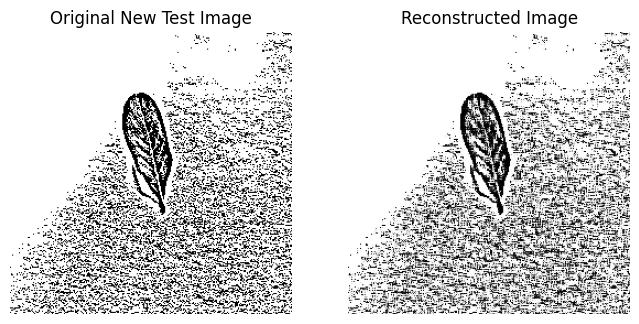

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_mada_leaf5.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.9851317  0.985023   0.88227546]
 [0.9997707  0.99999917 0.9999964  ... 0.00480972 0.86295545 0.79886407]
 [0.9988764  0.9998204  0.9987214  ... 0.98936087 0.9988808  0.58319896]
 ...
 [0.9972319  0.99919564 0.9947666  ... 0.05140221 0.9525108  0.07926553]
 [0.23583464 0.9985506  0.9472254  ... 0.92775464 0.9982444  0.98371315]
 [0.8193866  0.9999323  0.9729461  ... 0.11813206 0.96975505 0.95246786]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/mada_leaf5.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_mada_leaf5.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.006026)


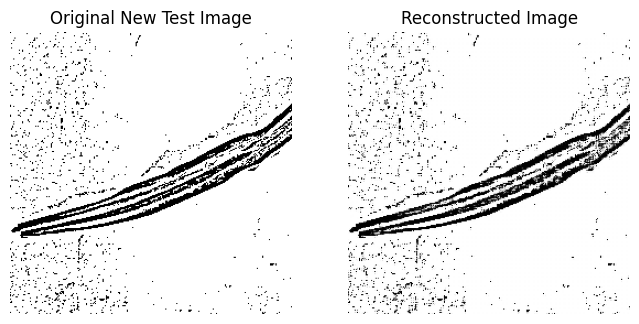

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_lily_leaf3.jpg
Reconstructed Image Matrix:
[[0.02335874 0.998009   0.99878675 ... 0.99976104 0.9987633  0.997509  ]
 [0.9949935  0.99998474 0.9999987  ... 0.99999905 0.99995196 0.999964  ]
 [0.98745954 0.9994605  0.99640536 ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.99731255 0.99999976 0.99990344 ... 0.9999969  0.9999944  0.99999726]
 [0.00174012 0.99641126 0.99870324 ... 0.9975889  0.9995703  0.9994972 ]
 [0.979856   0.99993646 0.9879908  ... 0.9994221  0.9888361  0.99853826]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/lily_leaf3.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_lily_leaf3.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.009245)


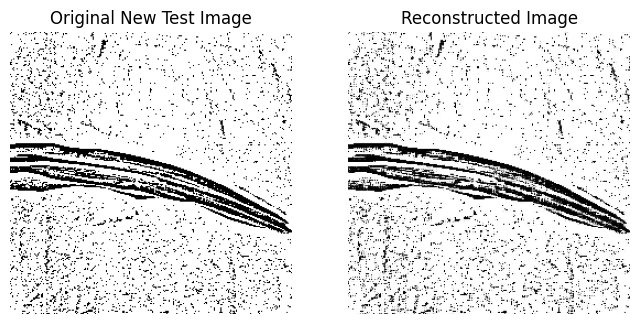

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_lily_leaf4.jpg
Reconstructed Image Matrix:
[[8.4657359e-01 2.2802693e-01 9.9899739e-01 ... 9.9435484e-01
  9.9925846e-01 9.4757235e-01]
 [4.1003591e-01 9.9983788e-01 9.9996877e-01 ... 9.9997604e-01
  9.9988222e-01 9.9968016e-01]
 [9.9835348e-01 9.9984002e-01 9.9704248e-01 ... 4.5862931e-04
  9.9561042e-01 9.7895837e-01]
 ...
 [9.9995947e-01 1.0000000e+00 9.9904090e-01 ... 1.0000000e+00
  9.9999666e-01 9.9998510e-01]
 [9.9868935e-01 9.9383801e-01 9.9978882e-01 ... 9.8292994e-01
  9.9846041e-01 9.9871922e-01]
 [9.9591053e-01 9.9909604e-01 9.9895942e-01 ... 9.9794239e-01
  9.9013418e-01 9.9918622e-01]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/lily_leaf4.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_lily_leaf4.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.017096)


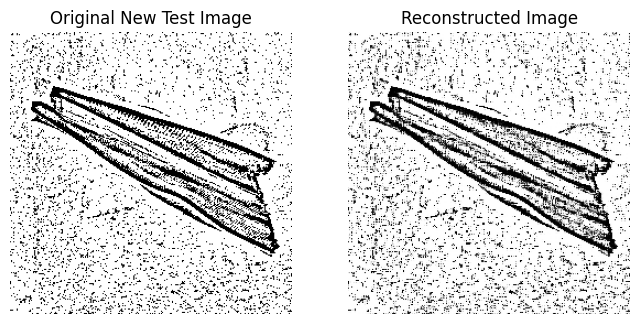

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_lily_leaf5.jpg
Reconstructed Image Matrix:
[[0.9875453  0.9002824  0.9657497  ... 0.9999261  0.9889608  0.9926938 ]
 [0.9943494  0.92493755 0.00249798 ... 0.9999913  0.99506444 0.00788472]
 [0.99624807 0.03443602 0.0050712  ... 0.99950635 0.99909604 0.9928758 ]
 ...
 [0.9998367  0.9999702  0.99746895 ... 0.05479654 0.04005906 0.02212056]
 [0.9865297  0.9721932  0.97678024 ... 0.9998134  0.9031268  0.98147297]
 [0.9976682  0.99913126 0.99593014 ... 0.21178678 0.9680246  0.79542863]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/lily_leaf5.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_lily_leaf5.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.054407)


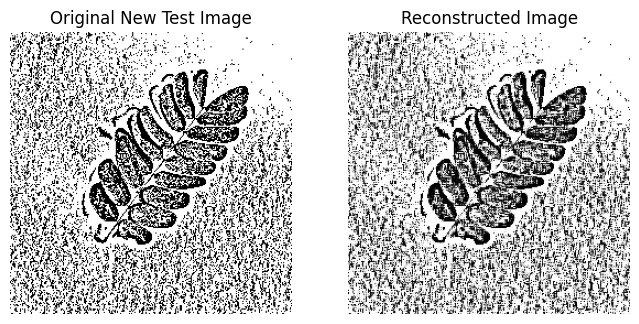

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_gulmo2.jpg
Reconstructed Image Matrix:
[[0.9088333  0.6577414  0.9895756  ... 0.99976104 0.9987633  0.997509  ]
 [0.9495238  0.14028399 0.9996605  ... 0.99999905 0.99995196 0.999964  ]
 [0.9962304  0.9995202  0.9986714  ... 0.99622536 0.99969625 0.9997875 ]
 ...
 [0.98662007 0.99998295 0.99991226 ... 0.99999905 0.00748398 0.9883902 ]
 [0.9915285  0.99978894 0.9986953  ... 0.9993274  0.9911607  0.9813768 ]
 [0.8599174  0.00470915 0.28796676 ... 0.99882454 0.86215067 0.99718106]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/gulmo2.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_gulmo2.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf does NOT belong to MBMU Campus. (MSE: 0.034898)


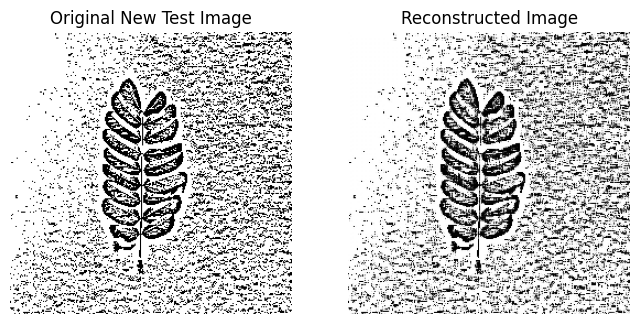

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_gulmo3.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.9509367  0.8670559  0.16351505]
 [0.9997707  0.99999917 0.9999964  ... 0.1493191  0.77768403 0.571517  ]
 [0.9988764  0.9998204  0.9987214  ... 0.9902749  0.9980557  0.99986696]
 ...
 [0.9977659  0.99996626 0.95902413 ... 0.99993134 0.64440334 0.7902821 ]
 [0.9988801  0.99962735 0.9999174  ... 0.8729492  0.9439909  0.8471653 ]
 [0.9984668  0.9967709  0.9787634  ... 0.9994746  0.93978107 0.96430147]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/gulmo3.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_gulmo3.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.026517)


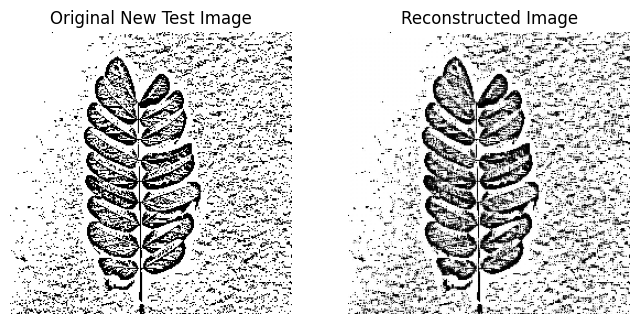

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_gulmo4.jpg
Reconstructed Image Matrix:
[[0.9941982  0.9987703  0.999759   ... 0.9408313  0.38046017 0.24461493]
 [0.9997707  0.99999917 0.9999964  ... 0.99955815 0.8866289  0.9969025 ]
 [0.9988764  0.9998204  0.9987214  ... 0.99852645 0.9983523  0.9975509 ]
 ...
 [0.99813545 0.9986922  0.99955815 ... 0.99912304 0.02102314 0.9916082 ]
 [0.99976975 0.97847605 0.99893254 ... 0.99955803 0.9930663  0.984993  ]
 [0.3788868  0.47338802 0.99736893 ... 0.99972636 0.8881084  0.9918419 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/gulmo4.jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_gulmo4.jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)

The new leaf belongs to MBMU Campus. (MSE: 0.025906)


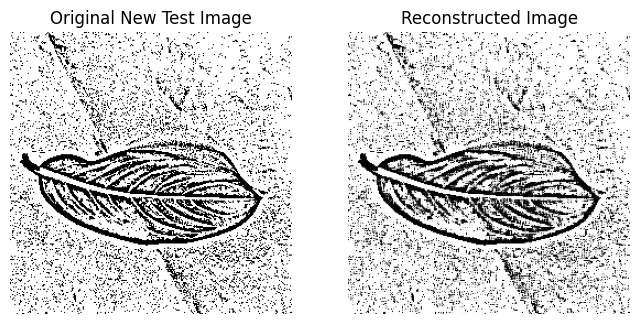

New reconstructed image saved at: /content/drive/MyDrive/reconstructed_Madagascar(2).jpg
Reconstructed Image Matrix:
[[0.8970579  0.97769254 0.04717213 ... 0.99997497 0.9998436  0.99963164]
 [0.99939346 0.9997522  0.99998033 ... 0.9999838  0.9999914  0.9999342 ]
 [0.99648416 0.99929047 0.9637206  ... 0.98867023 0.9970944  0.99598783]
 ...
 [0.9998735  1.         0.99948823 ... 0.99999964 0.9999964  0.9999645 ]
 [0.99658966 0.9941969  0.99983203 ... 0.9987262  0.01732565 0.01071206]
 [0.9966343  0.99571556 0.9965809  ... 0.9991806  0.9988133  0.9920677 ]]


In [ ]:
# Define the path of the new test image (Change filename accordingly)
new_test_image_path = "/content/drive/MyDrive/NNminiProject_1/Madagascar(2).jpg"

# Preprocess the new image
new_test_image = preprocess_image(new_test_image_path)

# Pass the new image through the autoencoder
with torch.no_grad():
    new_reconstructed_image = model(new_test_image).cpu().numpy().squeeze()

# Compute MSE for the new image
new_mse = np.mean((new_test_image.cpu().numpy().squeeze() - new_reconstructed_image) ** 2)

# Classify based on MSE threshold
if new_mse < threshold_mse:
    print(f"The new leaf belongs to MBMU Campus. (MSE: {new_mse:.6f})")
else:
    print(f"The new leaf does NOT belong to MBMU Campus. (MSE: {new_mse:.6f})")

# Display original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(new_test_image.cpu().squeeze(), cmap="gray")
ax[0].set_title("Original New Test Image")
ax[0].axis("off")

ax[1].imshow(new_reconstructed_image, cmap="gray")
ax[1].set_title("Reconstructed Image")
ax[1].axis("off")

plt.show()

# Save the reconstructed image
new_reconstructed_path = "/content/drive/MyDrive/reconstructed_Madagascar(2).jpg"
cv2.imwrite(new_reconstructed_path, (new_reconstructed_image * 255).astype(np.uint8))
print(f"New reconstructed image saved at: {new_reconstructed_path}")

# Print reconstructed image matrix
print("Reconstructed Image Matrix:")
print(new_reconstructed_image)